## Important Libraries

In [55]:
import numpy as np
import pandas as pd
import os
import cv2
import seaborn as sns 
import matplotlib.pyplot as plt
import pickle
from tqdm import tqdm
from keras.models import Sequential,Model,load_model
from keras.layers import Dense,Dropout,BatchNormalization,Conv2D,MaxPooling2D,Input,Flatten
from keras.applications.vgg16 import VGG16
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array
from keras.callbacks import ReduceLROnPlateau,EarlyStopping,ModelCheckpoint
from sklearn.metrics import classification_report,confusion_matrix
import warnings 
warnings.filterwarnings('ignore')

## Initial Hyperparameters

In [56]:
img_size=(224,224)
batch_size=64
seed=42
epochs=30

## Read Training Images ,Split it to (train,validation) and Show them

In [57]:
train_dir=r'/kaggle/input/intel-image-classification/seg_train/seg_train'
train_generator=ImageDataGenerator(rescale=1./255,validation_split=0.2)
train_data=train_generator.flow_from_directory(directory=train_dir,
                                                subset='training',
                                                target_size=img_size,
                                                color_mode='rgb',
                                                class_mode='categorical',
                                                shuffle=True,
                                                seed=seed,
                                                batch_size=batch_size)

Found 11230 images belonging to 6 classes.


In [58]:
val_data=train_generator.flow_from_directory(directory=train_dir,
                                            subset='validation',
                                            color_mode='rgb',
                                            class_mode='categorical',
                                            target_size=img_size,
                                            batch_size=batch_size,
                                            shuffle=False)

Found 2804 images belonging to 6 classes.


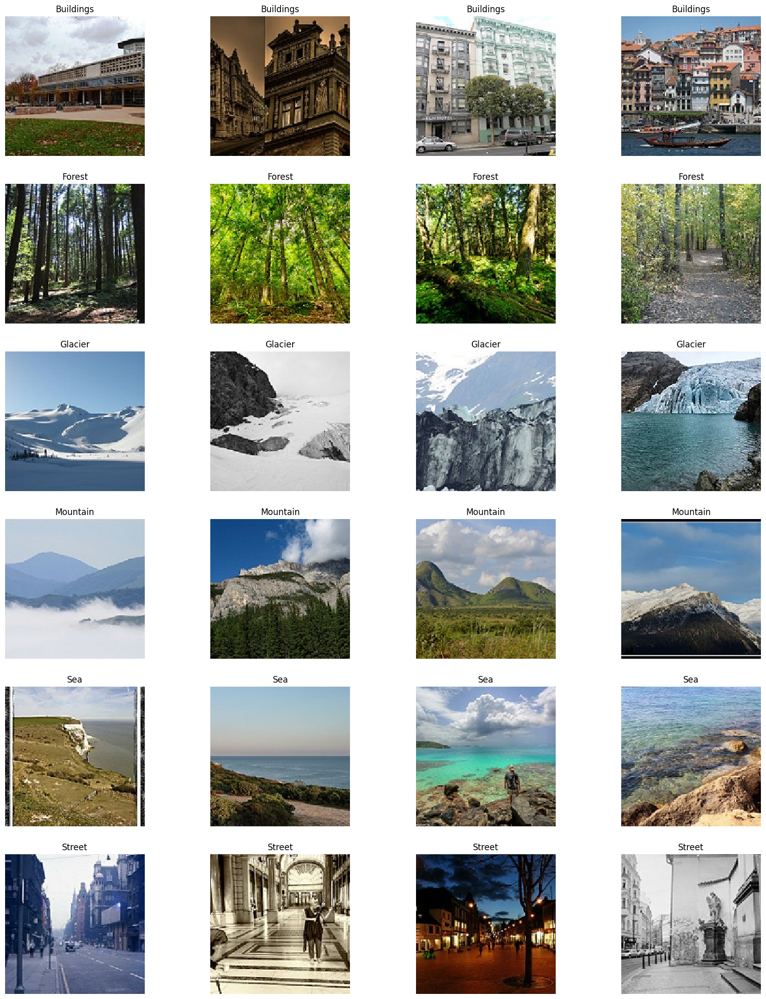

In [8]:
plt.figure(figsize=(20,25))
plot_index=1
for category in train_data.class_indices.keys():
    path=os.path.join(train_dir,category)
    img_num=1
    for img in os.listdir(path):
        if img_num<=4:
            img_path=os.path.join(path,img)
            img=load_img(img_path,target_size=img_size)
            plt.subplot(6,4,plot_index)
            plt.title(category.capitalize())
            plt.axis('off')
            plt.imshow(img)
            img_num+=1
            plot_index+=1
        else:
            break  
plt.show()    

## Read Testing Images and Show it

In [59]:
test_dir=r'/kaggle/input/intel-image-classification/seg_test/seg_test'
test_generator=ImageDataGenerator(rescale=1./255)
test_data=test_generator.flow_from_directory(directory=test_dir,
                                                target_size=img_size,
                                                color_mode='rgb',
                                                class_mode='categorical',
                                                shuffle=False,
                                                batch_size=batch_size)

Found 3000 images belonging to 6 classes.


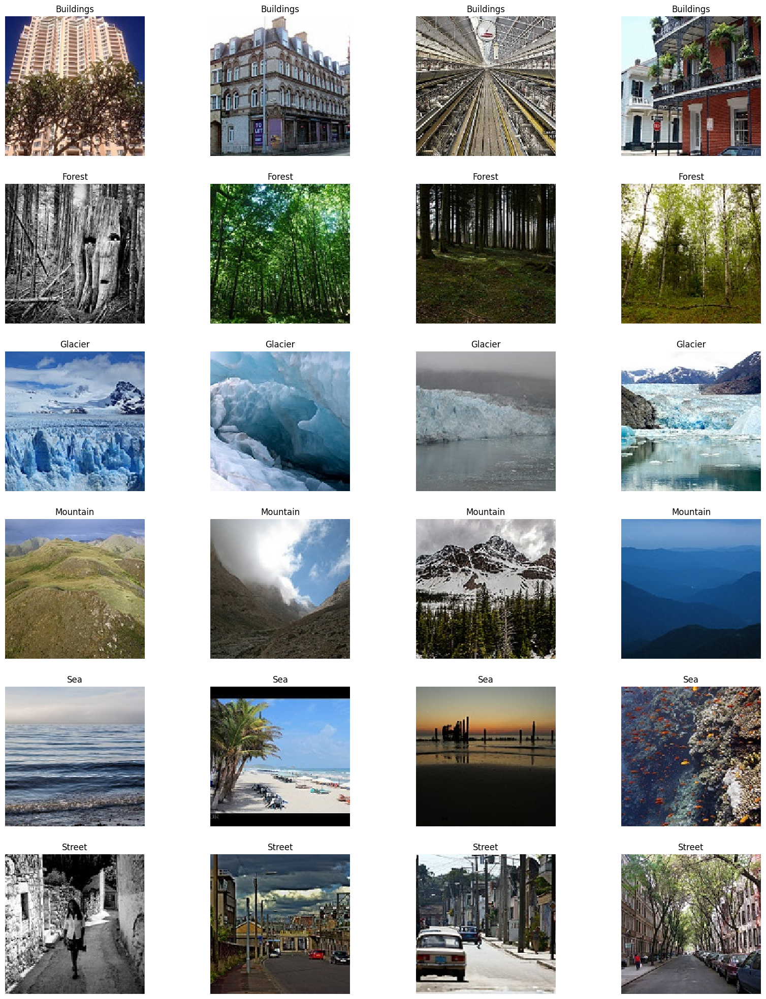

In [10]:
plt.figure(figsize=(20,25))
plot_index=1
for category in test_data.class_indices.keys():
    path=os.path.join(test_dir,category)
    img_num=1
    for img in os.listdir(path):
        if img_num<=4:
            img_path=os.path.join(path,img)
            img=load_img(img_path,target_size=img_size)
            plt.subplot(6,4,plot_index)
            plt.title(category.capitalize())
            plt.axis('off')
            plt.imshow(img)
            img_num+=1
            plot_index+=1
        else:
            break  
plt.show()   

## Read Prediction Images and Show it

In [60]:
pred_dir=r'/kaggle/input/intel-image-classification/seg_pred/seg_pred'
pred_data=[]
for img in tqdm(os.listdir(pred_dir)[:500]):
    img_path=os.path.join(pred_dir,img)
    image=load_img(img_path,target_size=img_size)
    image_array=img_to_array(image)
    image_array/=255
    pred_data.append(image_array)

100%|██████████| 500/500 [00:01<00:00, 342.05it/s]


In [61]:
pred_data=np.array(pred_data).reshape(-1,img_size[0],img_size[1],3)

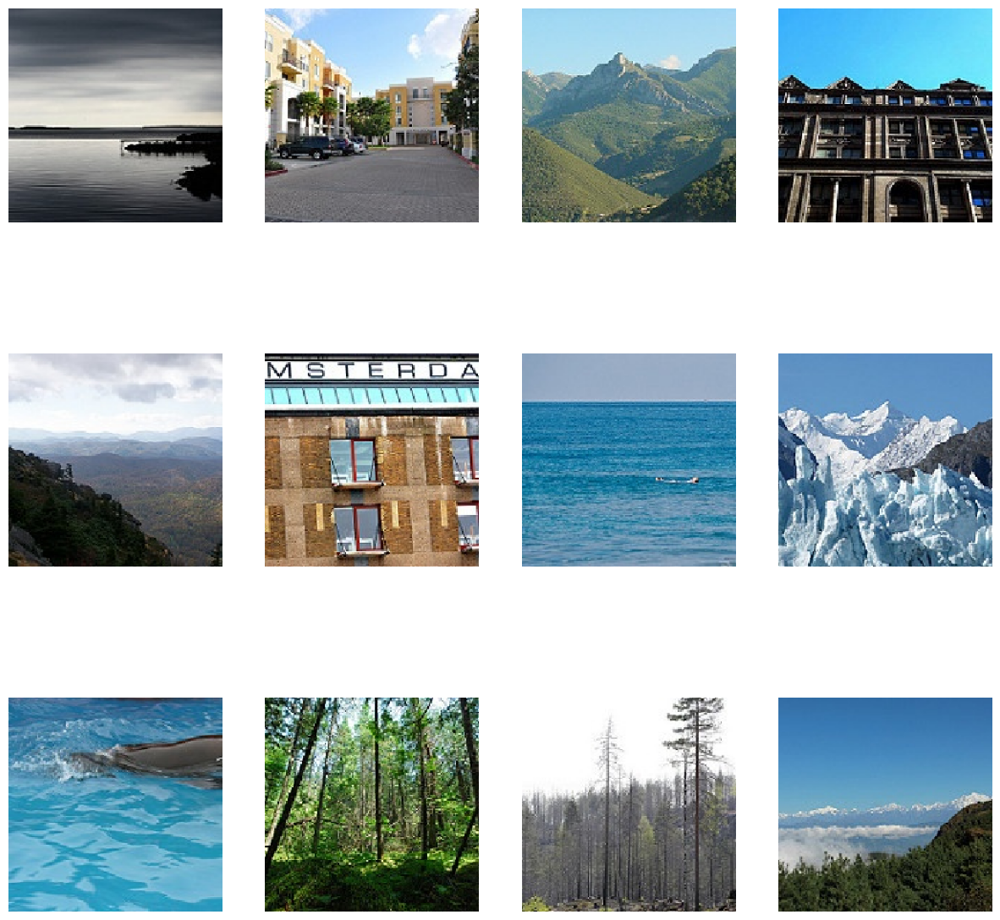

In [13]:
plt.figure(figsize=(15,15))
plot_index=1
for img in os.listdir(pred_dir):
    if plot_index<=12:
        img_path=os.path.join(pred_dir,img)
        image=load_img(img_path,target_size=img_size)
        plt.subplot(3,4,plot_index)
        plt.axis('off')
        plt.imshow(image)
        plot_index+=1
    else:
        break  
plt.show()  

## Saving Prediction Data

In [14]:
pickle.dump(pred_data,open('pred_data.pkl','wb'))

## Loading Prediction Data

In [ ]:
pred_data=pickle.load(open('pred_data.pkl','rb'))

## Modeling

In [15]:
vgg16_model=VGG16(input_shape=(224,224,3))
len(vgg16_model.layers)

553467096/553467096 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step


23

In [16]:
vgg16_model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 138,357,544 (527.79 MB)

 Trainable params: 138,357,544 (527.79 MB)

 Non-trainable params: 0 (0.00 B)

In [17]:
model=Sequential()
for layer in vgg16_model.layers[:-1]:
    model.add(layer)

In [18]:
for layer in model.layers:
    layer.trainable=False

In [19]:
model.add(Dense(6,activation='softmax'))

In [20]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ block1_conv1 (Conv2D)                │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 224, 224, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 112, 112, 128)       │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 56, 56, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 28, 28, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 28, 28, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 14, 14, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 14, 14, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 7, 7, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 25088)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc1 (Dense)                          │ (None, 4096)                │     102,764,544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ fc2 (Dense)                          │ (None, 4096)                │      16,781,312 │
├──────────────────────────────────────┼─────────────────────────────┼──────────────

 Total params: 134,285,126 (512.26 MB)

 Trainable params: 24,582 (96.02 KB)

 Non-trainable params: 134,260,544 (512.16 MB)

In [21]:
cp=ModelCheckpoint('Intel_Image_Classification_weights.keras',
                    monitor='val_loss',
                    save_best_only=True,
                    verbose=1)
early_stopping=EarlyStopping(monitor='val_loss',
                                patience=5,
                                min_delta=0.001,
                                verbose=1,
                                restore_best_weights=True)
reduce_LR=ReduceLROnPlateau(monitor='val_loss',
                            patience=5,
                            min_delta=0.001,
                            factor=0.5,
                            min_lr=0.001,
                            verbose=1)
callbacks=[cp,early_stopping,reduce_LR]

In [22]:
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])

In [23]:
history=model.fit(train_data,validation_data=val_data,epochs=epochs,steps_per_epoch=train_data.samples//train_data.batch_size,callbacks=callbacks)

Epoch 1/30
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 555ms/step - accuracy: 0.5685 - loss: 1.1270
Epoch 1: val_loss improved from inf to 0.55421, saving model to Intel_Image_Classification_weights.keras
175/175 ━━━━━━━━━━━━━━━━━━━━ 173s 841ms/step - accuracy: 0.5693 - loss: 1.1251 - val_accuracy: 0.7992 - val_loss: 0.5542 - learning_rate: 0.0010
Epoch 2/30
  1/175 ━━━━━━━━━━━━━━━━━━━━ 52s 302ms/step - accuracy: 0.7812 - loss: 0.6263
Epoch 2: val_loss did not improve from 0.55421
175/175 ━━━━━━━━━━━━━━━━━━━━ 13s 75ms/step - accuracy: 0.7812 - loss: 0.6263 - val_accuracy: 0.7914 - val_loss: 0.5607 - learning_rate: 0.0010
Epoch 3/30
175/175 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step - accuracy: 0.8011 - loss: 0.5361
Epoch 3: val_loss improved from 0.55421 to 0.47169, saving model to Intel_Image_Classification_weights.keras
175/175 ━━━━━━━━━━━━━━━━━━━━ 69s 384ms/step - accuracy: 0.8012 - loss: 0.5360 - val_accuracy: 0.8217 - val_loss: 0.4717 - learning_rate: 0.0010
Epoch 4/30
  1/175 ━━━━━━━━━━━━━━━━━━━━ 51

## Evaluation

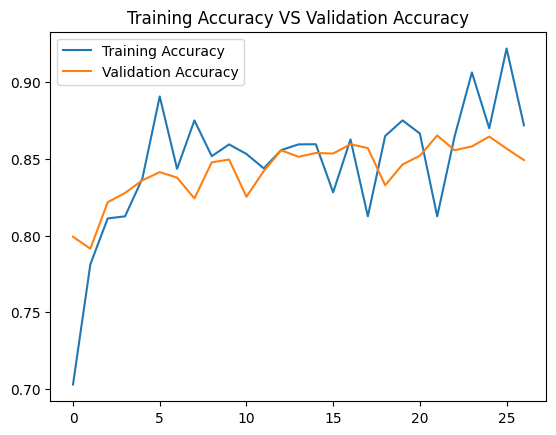

In [24]:
plt.title("Training Accuracy VS Validation Accuracy")
plt.plot(history.history['accuracy'],label='Training Accuracy')
plt.plot(history.history['val_accuracy'],label='Validation Accuracy')
plt.legend()
plt.show()

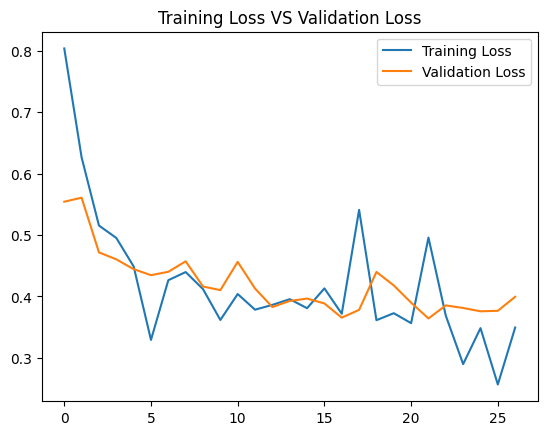

In [25]:
plt.title("Training Loss VS Validation Loss")
plt.plot(history.history['loss'],label='Training Loss')
plt.plot(history.history['val_loss'],label='Validation Loss')
plt.legend()
plt.show()

In [28]:
model.evaluate(test_data)

47/47 ━━━━━━━━━━━━━━━━━━━━ 45s 962ms/step - accuracy: 0.8920 - loss: 0.2840


[0.36846303939819336, 0.8600000143051147]

In [33]:
y_pred=model.predict(test_data)

47/47 ━━━━━━━━━━━━━━━━━━━━ 14s 286ms/step


In [35]:
y_pred[0]

array([9.9602580e-01, 1.5161492e-05, 1.8722062e-04, 8.9568945e-05,
       2.4115515e-04, 3.4411275e-03], dtype=float32)

In [36]:
y_p=np.argmax(y_pred,axis=1)

In [39]:
y_p[0]

0

In [42]:
report=classification_report(test_data.classes,y_p)
print("Classification Report : \n"+report)

Classification Report : 
              precision    recall  f1-score   support

           0       0.85      0.91      0.88       437
           1       0.98      0.98      0.98       474
           2       0.78      0.84      0.81       553
           3       0.79      0.77      0.78       525
           4       0.87      0.84      0.86       510
           5       0.92      0.84      0.88       501

    accuracy                           0.86      3000
   macro avg       0.86      0.86      0.86      3000
weighted avg       0.86      0.86      0.86      3000



In [43]:
conf_mat=confusion_matrix(test_data.classes,y_p)
conf_mat

array([[398,   0,   0,   1,   5,  33],
       [  0, 463,   3,   6,   1,   1],
       [  1,   3, 462,  56,  27,   4],
       [  2,   3,  89, 406,  25,   0],
       [  2,   0,  34,  43, 430,   1],
       [ 64,   4,   2,   5,   5, 421]])

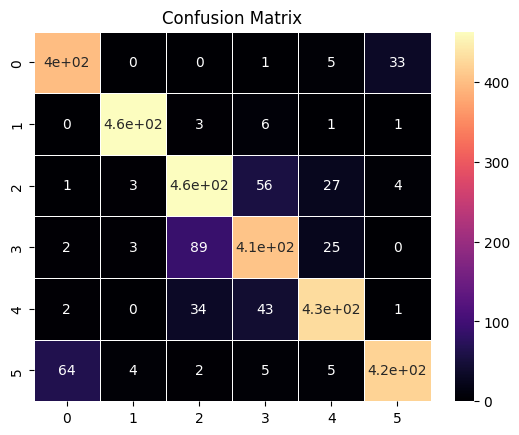

In [48]:
plt.title("Confusion Matrix")
sns.heatmap(conf_mat,annot=True,cmap='magma',linecolor='white',linewidths=0.5)
plt.show()

## Saving Model

In [49]:
model.save('Intel_Image_Classification_Model.h5')

## Loading Model

In [62]:
model=load_model('Intel_Image_Classification_Model.h5')

## Predict new images without Labels 

In [63]:
images_pred=model.predict(pred_data)

16/16 ━━━━━━━━━━━━━━━━━━━━ 3s 154ms/step


In [64]:
images_pred[0]

array([2.2545765e-04, 4.9978717e-06, 2.5638130e-03, 1.3134822e-03,
       9.9576771e-01, 1.2446583e-04], dtype=float32)

In [65]:
images_pred_labels=np.argmax(images_pred,axis=1)

In [66]:
images_pred_labels[0]

4

## Show Some Prediction Images with their Prediction Labels

In [84]:
labels=[i for i in test_data.class_indices.keys()]
labels

['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

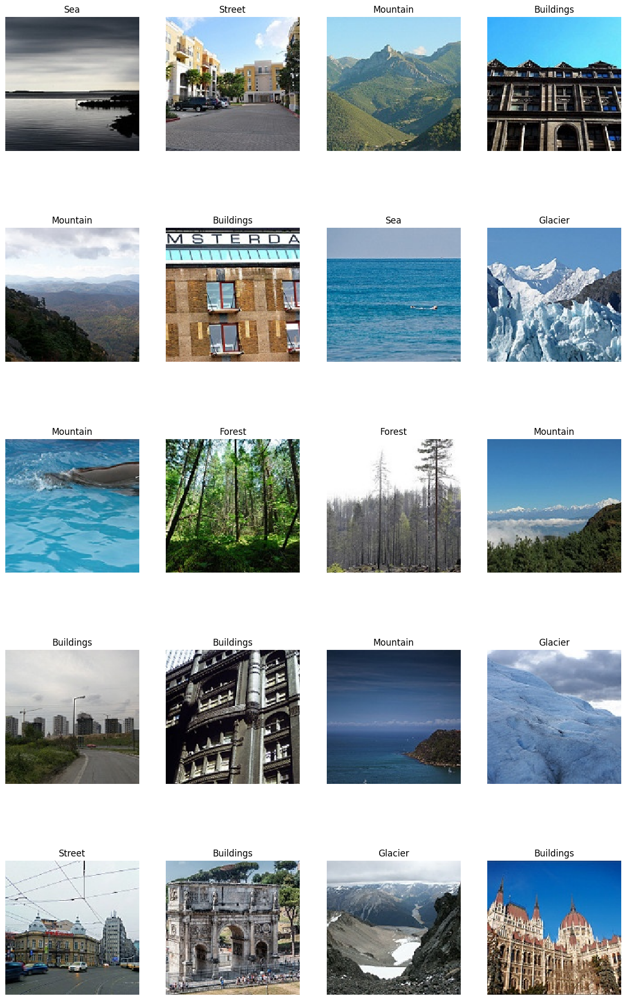

In [87]:
plt.figure(figsize=(15,25))
plot_index=1
for img in os.listdir(pred_dir):
    if plot_index<=20:
        label=labels[images_pred_labels[plot_index-1]]
        img_path=os.path.join(pred_dir,img)
        image=load_img(img_path,target_size=img_size)
        plt.subplot(5,4,plot_index)
        plt.title(label.capitalize())
        plt.axis('off')
        plt.imshow(image)
        plot_index+=1
    else:
        break  
plt.show()  